In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.7.0


In [ ]:
import tensorflow_datasets as tfds
tfds.__version__

'4.0.1'

In [ ]:
(raw_train,raw_validation,raw_test),metadata = tfds.load(
    'cats_vs_dogs',split=['train[:80%]','train[80%:90%]','train[90%:]'],
    with_info=True,as_supervised=True)

In [ ]:
print(raw_train)
print(raw_validation)
print(raw_test)
# <PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
# (None,None,3) : image shape (height,width,channel), because all images have different size shape says None
# ():label shape

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [ ]:
# data visualization & pre-processing
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

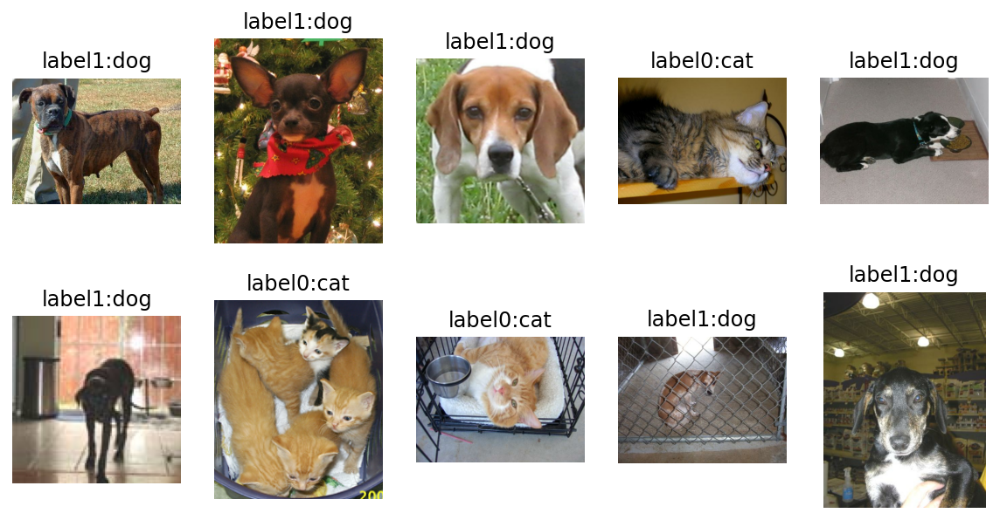

In [ ]:
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str

for idx, (image,label) in enumerate(raw_train.take(10)): # literally take 10 data
  plt.subplot(2,5,idx+1)
  plt.imshow(image)
  plt.title(f'label{label}:{get_label_name(label)}') #?
  plt.axis('off')

In [ ]:
# Type Casting : change data type from a to b

In [ ]:
IMG_SIZE = 160 # image size to resizing

def format_example(image,label):
  image = tf.cast(image,tf.float32) # tensorflow version of typecasting (image=float(image))
  image = (image/127.5) - 1 # edit scale of pixel value
  image = tf.image.resize(image,(IMG_SIZE,IMG_SIZE))
  return image, label

In [ ]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


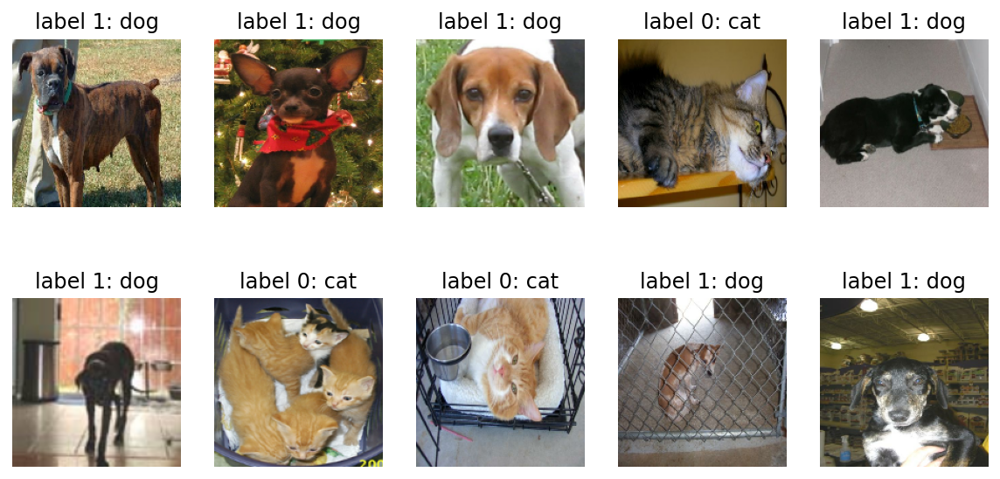

In [ ]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    # visualize image by matplotlib, every pixel has to be >0 
    # (-1:1) +1 /2 = (0:1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
# structure model by tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,MaxPooling2D
# .models has functions for structing model
# .layers has layer which is element of model

In [ ]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 20, 20, 64)      

In [ ]:
import numpy as np

image = np.array([[1,2],[3,4]])
print(image.shape)
image.flatten()

(2, 2)


array([1, 2, 3, 4])

In [ ]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
# optimizer : how to study, what's the best way to study
# loss : where to study (obviously where loss is minimal)
# metrics : grade how good model performances (accuracy,precision,recall)

In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [ ]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [ ]:
for image_batch, label_batch in train_batches.take(1):
  pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [ ]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))


20/20 [==============================] - 2s 77ms/step - loss: 0.6919 - accuracy: 0.5141
initial loss: 0.69
initial accuracy: 0.51


In [ ]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 69s 114ms/step - loss: 0.6093 - accuracy: 0.6628 - val_loss: 0.5606 - val_accuracy: 0.7094
Epoch 2/10
582/582 [==============================] - 68s 113ms/step - loss: 0.4848 - accuracy: 0.7623 - val_loss: 0.4933 - val_accuracy: 0.7696
Epoch 3/10
582/582 [==============================] - 67s 111ms/step - loss: 0.4221 - accuracy: 0.8058 - val_loss: 0.5428 - val_accuracy: 0.7395
Epoch 4/10
582/582 [==============================] - 66s 111ms/step - loss: 0.3631 - accuracy: 0.8418 - val_loss: 0.4852 - val_accuracy: 0.7764
Epoch 5/10
582/582 [==============================] - 67s 111ms/step - loss: 0.3076 - accuracy: 0.8684 - val_loss: 0.4909 - val_accuracy: 0.7868
Epoch 6/10
582/582 [==============================] - 67s 112ms/step - loss: 0.2514 - accuracy: 0.8981 - val_loss: 0.5249 - val_accuracy: 0.7790
Epoch 7/10
582/582 [==============================] - 67s 111ms/step - loss: 0.1960 - accuracy: 0.9261 - val_loss: 0.6163 - val_ac

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

In [ ]:
predictions = np.argmax(predictions, axis=1)
predictions

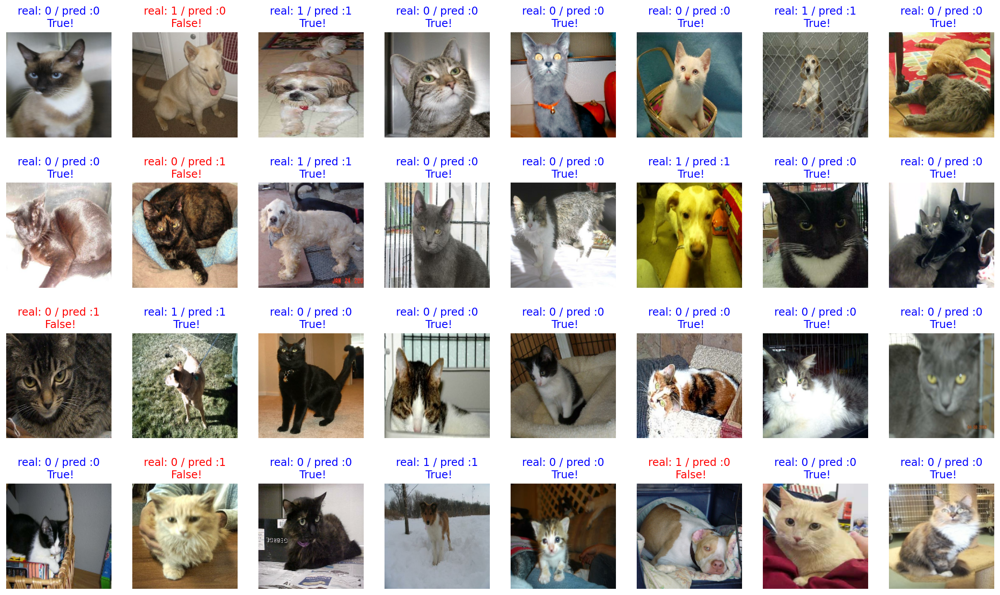

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0
for image,label,prediction in zip(images,labels,predictions):
  if label == prediction :
      count = count +1
print(count/32*100)

84.375


In [ ]:
IMG_SHAPE = (IMG_SIZE,IMG_SIZE,3)
# create base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [ ]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [ ]:
feature_batch = base_model(image_batch)
feature_batch.shape
# feature vector : extract features from image

TensorShape([32, 5, 5, 512])

In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [ ]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [ ]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [ ]:
base_model.trainable = False


In [ ]:
# model_최종_진짜_찐
model = tf.keras.Sequential([
                             base_model,
                             global_average_layer,
                             dense_layer,
                             prediction_layer
])

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 512)               262656    
                                                                 
 dense_9 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss = tf.keras.losses.sparse_categorical_crossentropy,
              metrics = ['accuracy'])

In [ ]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

In [ ]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

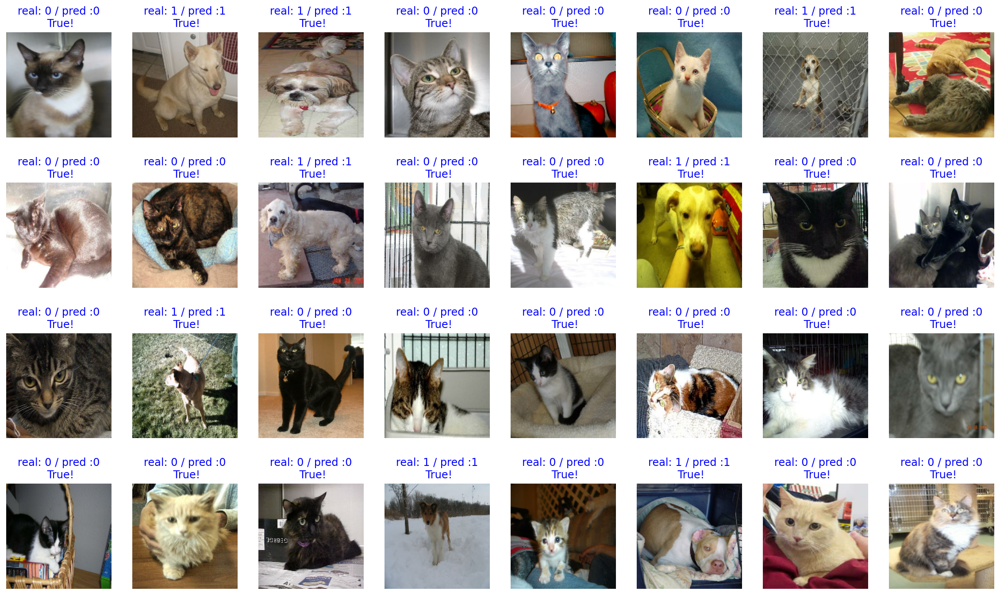

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


In [ ]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [ ]:
img_dir_path = '/content/drive/MyDrive/images'
os.path.exists(img_dir_path)

True

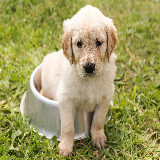

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'puppy-g811b00ff6_1920.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [ ]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [ ]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

In [ ]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")
    

This image seems 0% dog, and 100% cat.


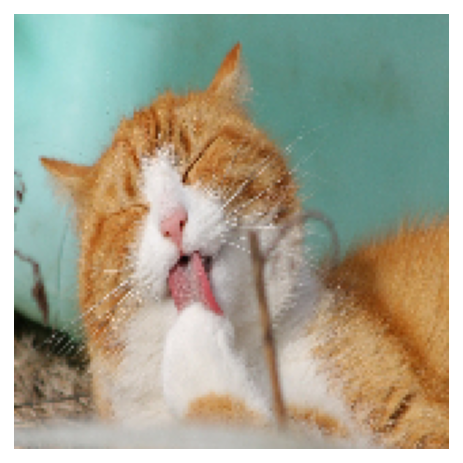

In [ ]:
filename = 'cat-gd67682b22_1920.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


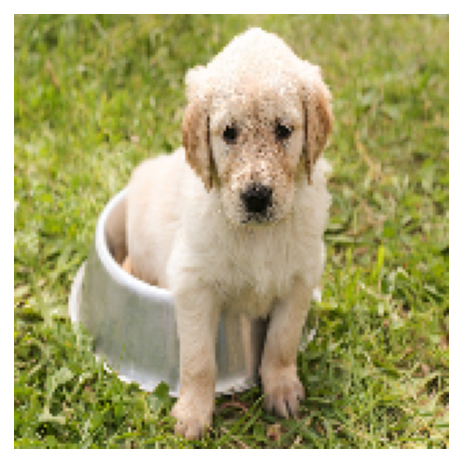

In [ ]:
filename = 'puppy-g811b00ff6_1920.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


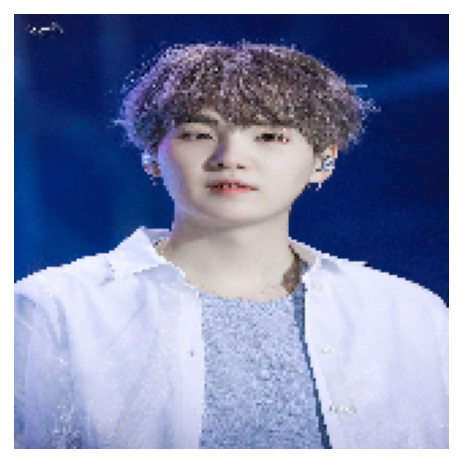

In [ ]:
filename = "myg.jpeg"
show_and_predict_image(img_dir_path, filename)